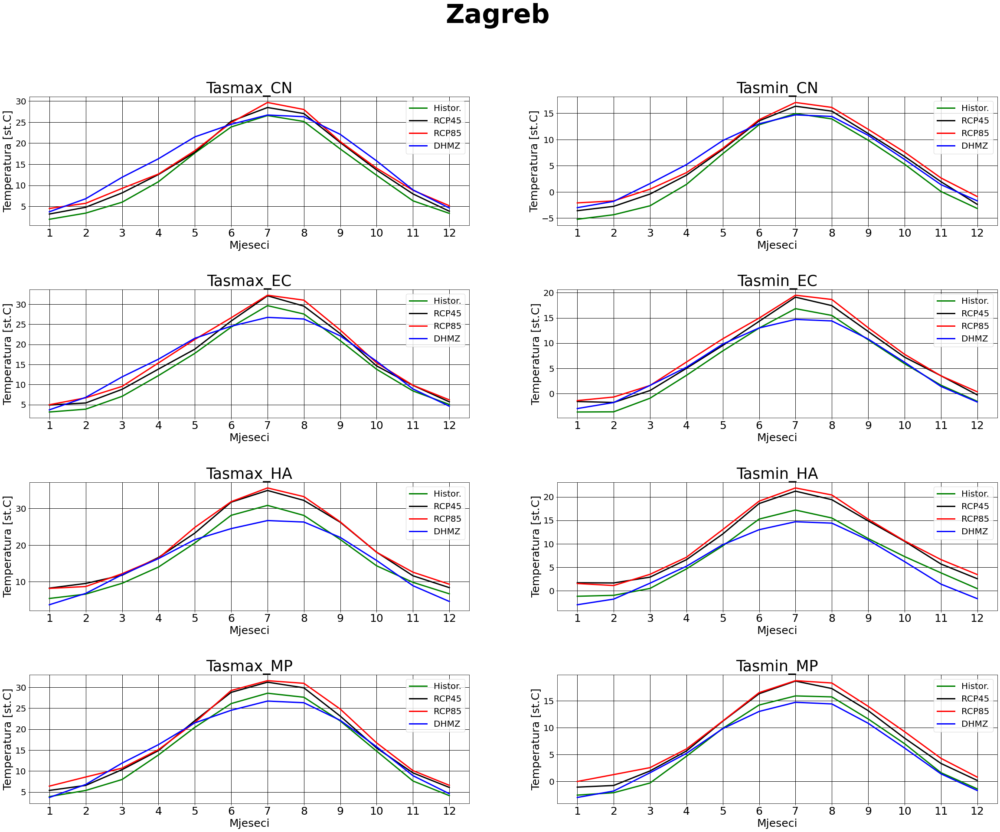

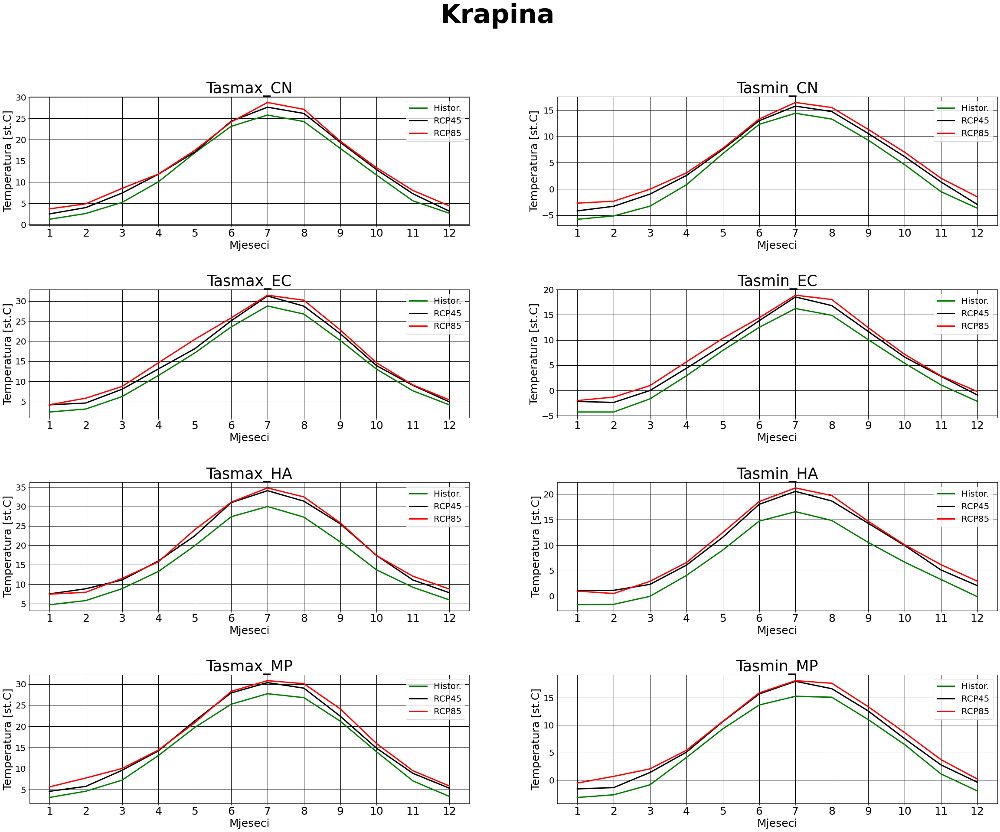

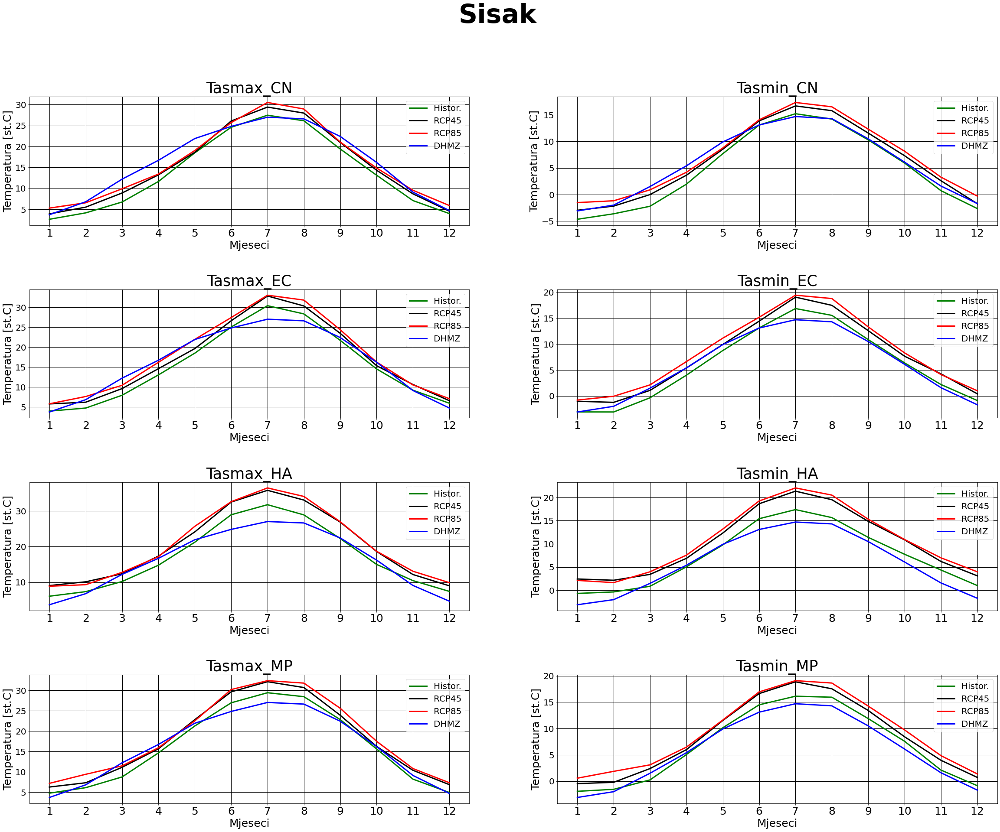

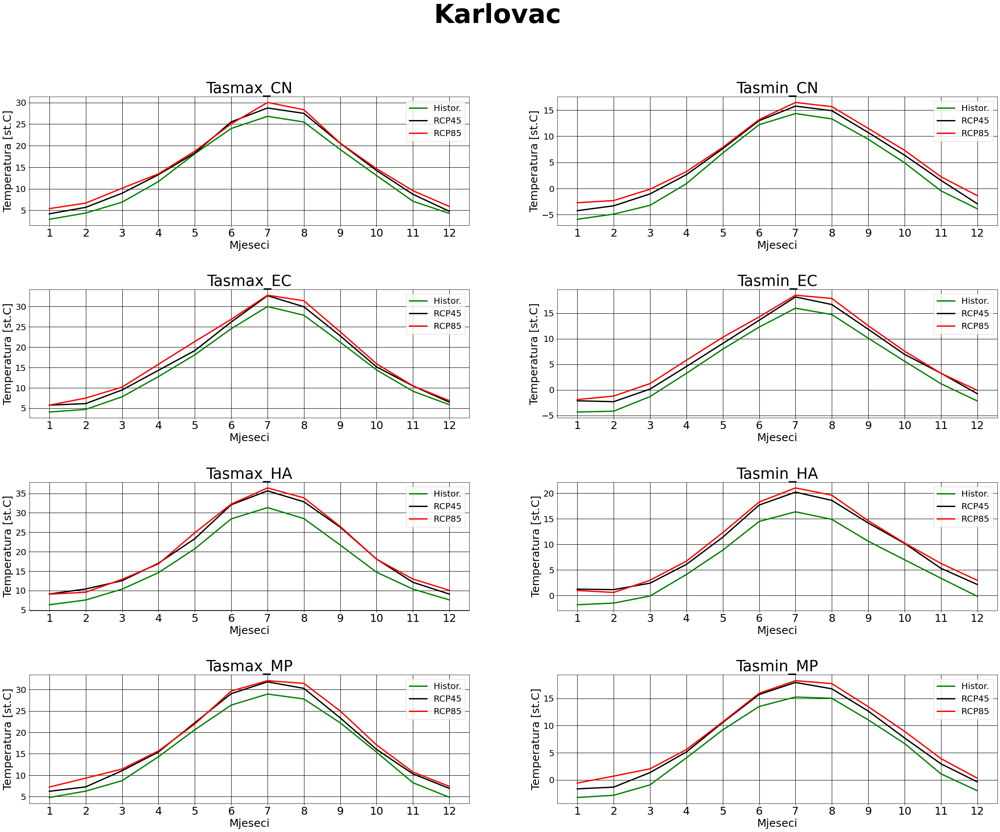

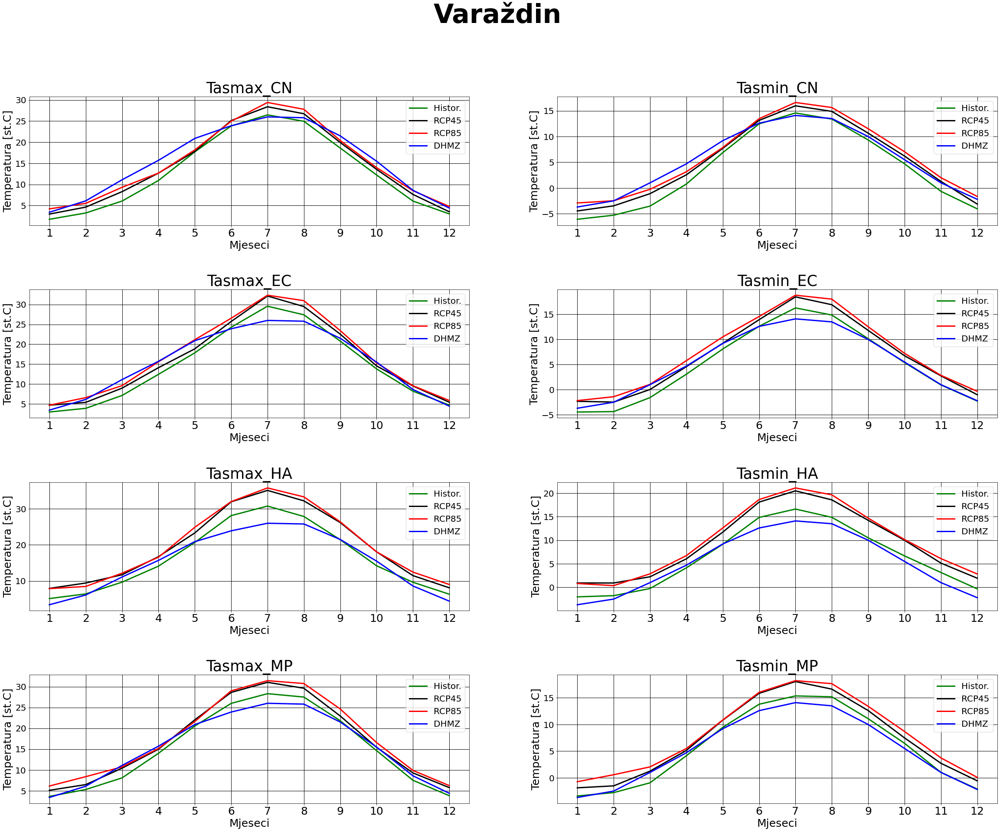

...

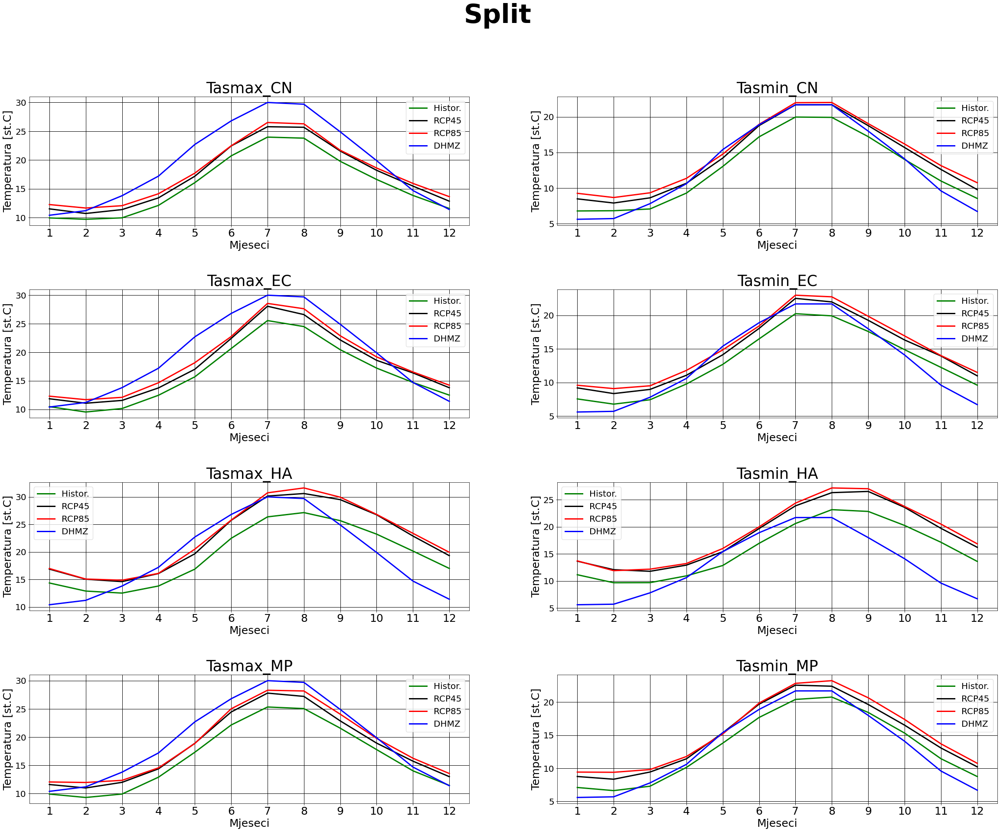

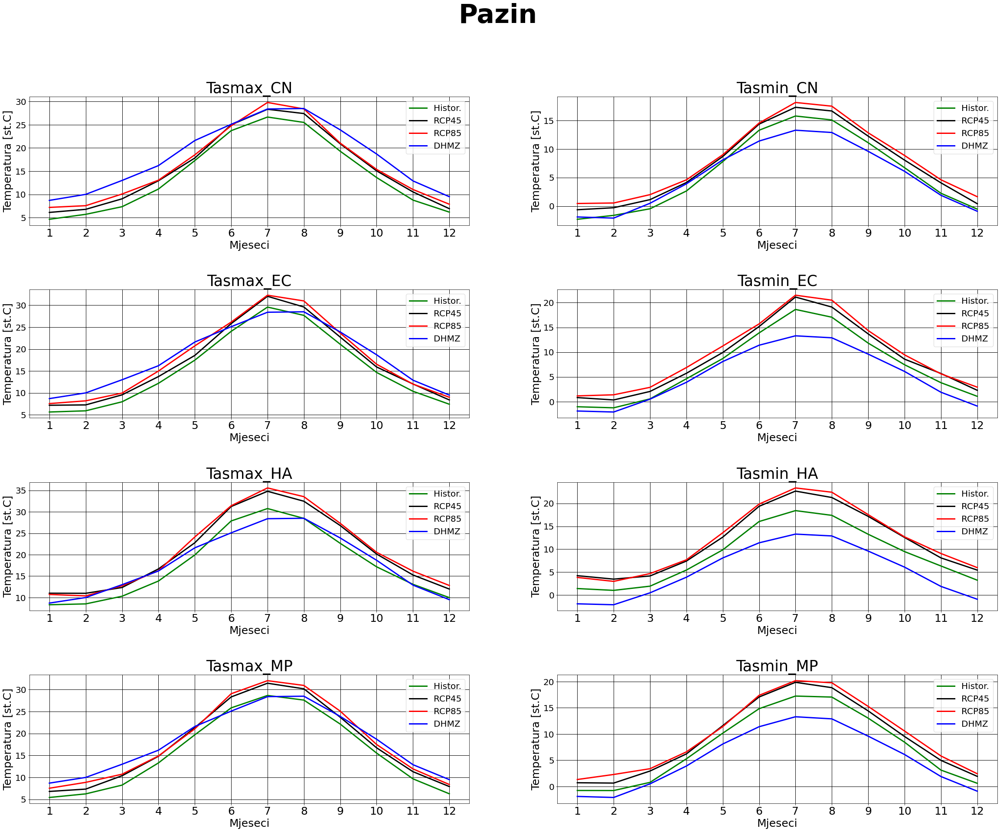

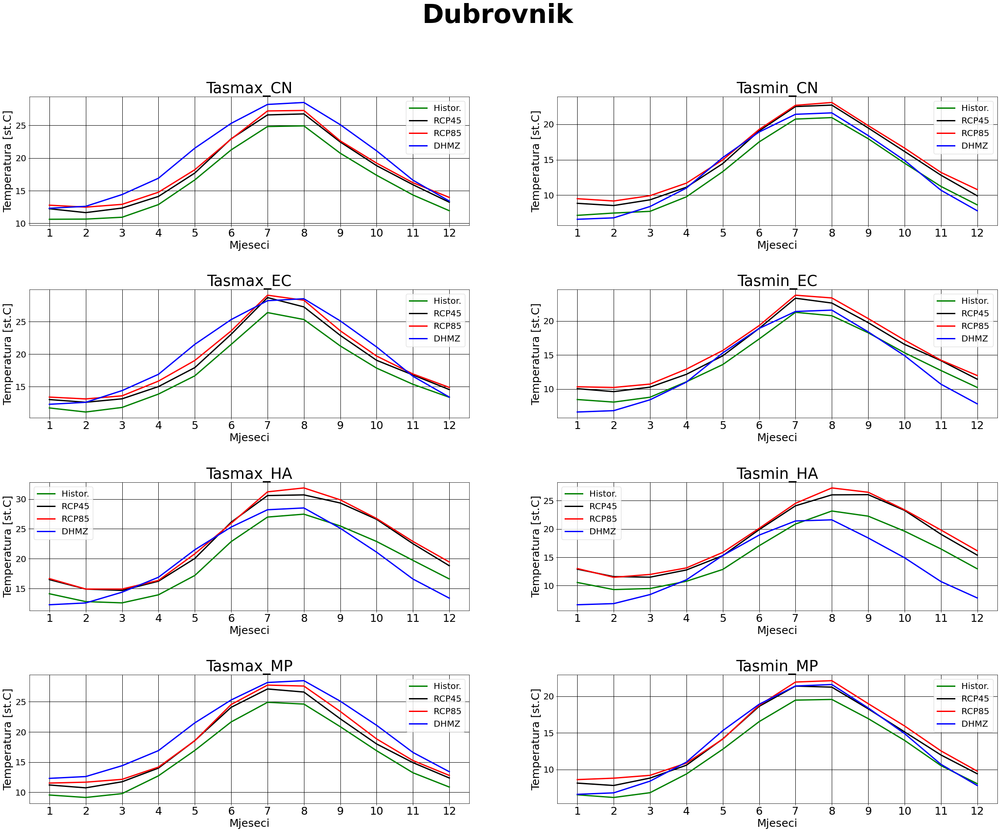

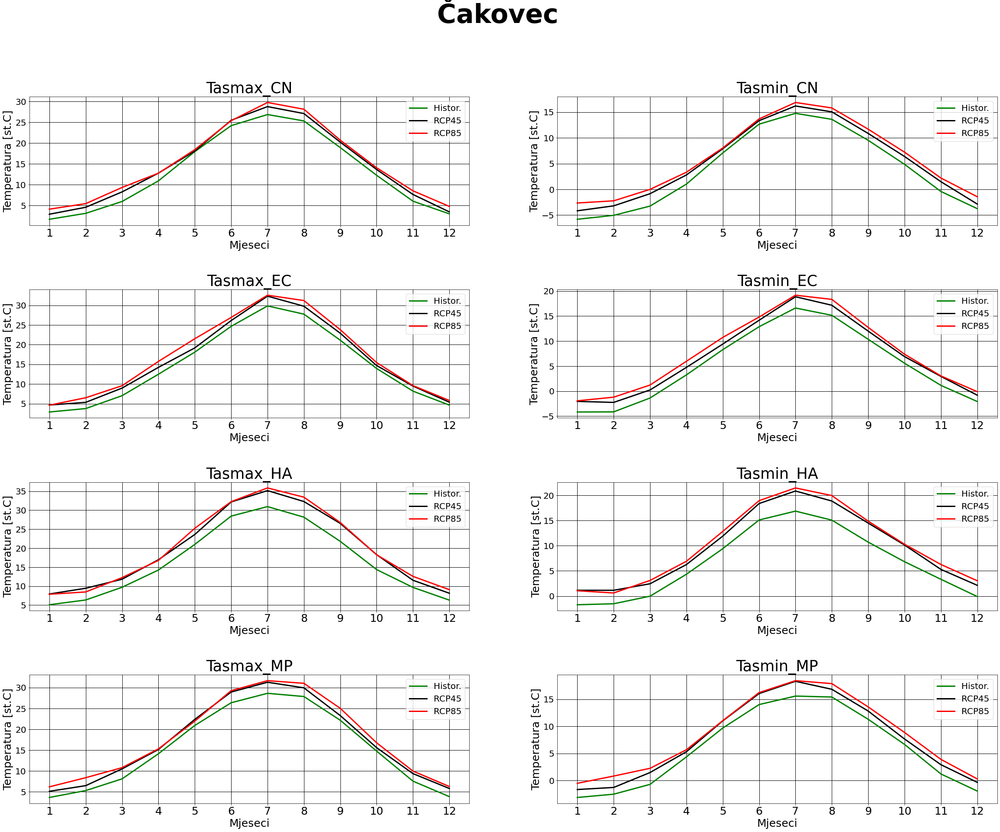

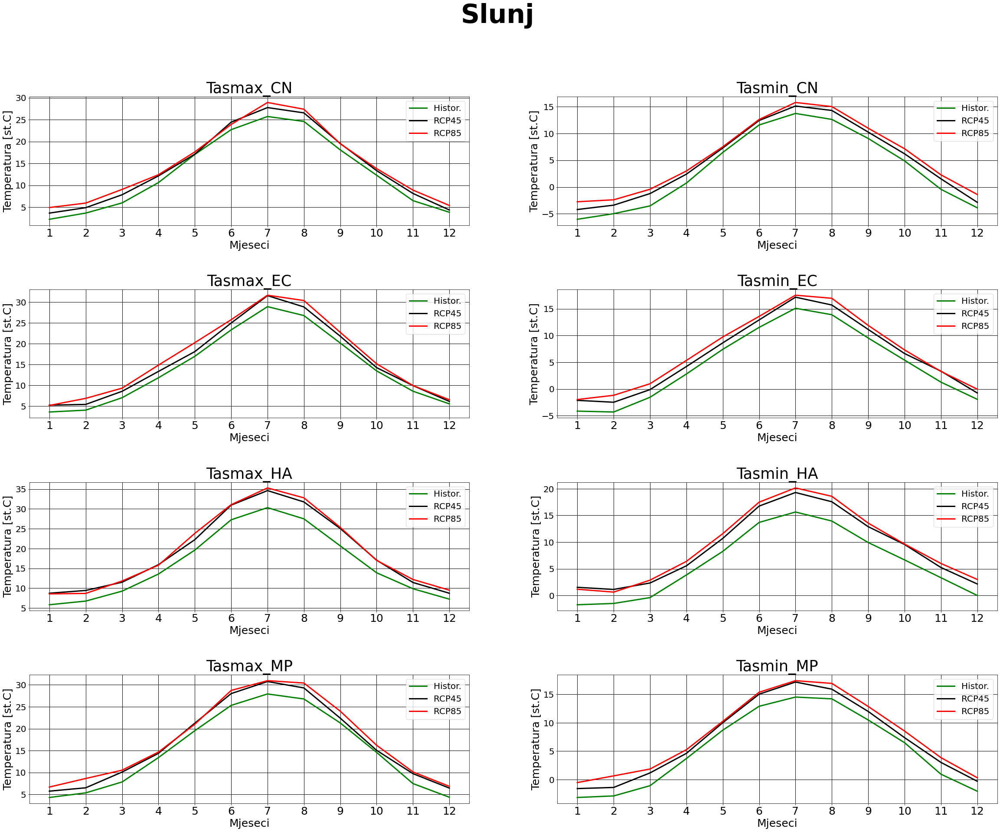

In [76]:
#kod za čitanje Netcdf=Network common data form
from netCDF4 import Dataset
import numpy as np
import numpy.ma as ma # MaskedArray
import matplotlib as mpl
import matplotlib.pyplot as plt

# crtanje historijske (01.01.1971.-31.12.2000.), RCP4.5 i RCP8.5 (01.01.2041.-31.12.2070.) 
# scenarija za svaku lokaciju i za svaki GCM model zasebno

plt.close('all')

#Funkcije

def Ucitavanje_P0 (GC,ts,G):
    file = '{}_{}_GRAD_{}_P0_ymonmean.nc'.format(GC,ts,G)
    fi = Dataset(file, mode='r')
    t = (fi.variables[ts][:].T).tolist()
    tm = [i for i in range(0,12)]
    for i in range (0,12):
        tm[i] = t[0][0][0][i]
    return tm

def Ucitavanje_RCP45 (GC,ts,G):
    file = '{}_{}_GRAD_{}_RCP45_P2_ymonmean.nc'.format(GC,ts,G)
    fi = Dataset(file, mode='r')
    t = (fi.variables[ts][:].T).tolist()
    tm = [i for i in range(0,12)]
    for i in range (0,12):
        tm[i] = t[0][0][0][i]
    return tm

def Ucitavanje_RCP85 (GC,ts,G):
    file = '{}_{}_GRAD_{}_RCP85_P2_ymonmean.nc'.format(GC,ts,G)
    fi = Dataset(file, mode='r')
    t = (fi.variables[ts][:].T).tolist()
    tm = [i for i in range(0,12)]
    for i in range (0,12):
        tm[i] = t[0][0][0][i]
    return tm


def Crtanje (th,tm45,tm85,title,b):
    time = [i for i in range(1,13)];
    
    ax[b].plot(time,th,'g',label='Histor.',linewidth=3)
    ax[b].plot(time,tm45,'k',label='RCP45',linewidth=3)
    ax[b].plot(time,tm85,'r',label='RCP85',linewidth=3)
    xTicks = np.arange(1,13)
    xTickLabels = np.arange(1,13)
        
    ax[b].grid(linestyle='-', linewidth='1', color='k');
    ax[b].set_title(title,fontsize=35)
    ax[b].set_xlabel('Mjeseci',fontsize=25)
    ax[b].set_ylabel('Temperatura [st.C]',fontsize=25)
    ax[b].set_xticks(xTicks)
    ax[b].set_xticklabels(xTickLabels,fontsize = 25)
    ax[b].tick_params(axis='y', labelsize=20)
    handles, labels = ax[b].get_legend_handles_labels()
    ax[b].legend(handles[::-1], labels[::-1])
    ax[b].legend(prop=dict(size=20))
    
#crtanje ako postoje DHMZ mjerenja za tu lokaciju
def Crtanje_dhmz (th,tm45,tm85,tm,title,b):
    time = [i for i in range(1,13)];
    
    ax[b].plot(time,th,'g',label='Histor.',linewidth=3)
    ax[b].plot(time,tm45,'k',label='RCP45',linewidth=3)
    ax[b].plot(time,tm85,'r',label='RCP85',linewidth=3)
    ax[b].plot(time,tm,'b',label='DHMZ',linewidth=3)
    xTicks = np.arange(1,13)
    xTickLabels = np.arange(1,13)
        
    ax[b].grid(linestyle='-', linewidth='1', color='k');
    ax[b].set_title(title,fontsize=35)
    ax[b].set_xlabel('Mjeseci',fontsize=25)
    ax[b].set_ylabel('Temperatura [st.C]',fontsize=25)
    ax[b].set_xticks(xTicks)
    ax[b].set_xticklabels(xTickLabels,fontsize = 25)
    ax[b].tick_params(axis='y', labelsize=20)
    handles, labels = ax[b].get_legend_handles_labels()
    ax[b].legend(handles[::-1], labels[::-1])
    ax[b].legend(prop=dict(size=20))



    


Gr=[i for i in range(0,22)]
Gr[1]='Zagreb'; #
Gr[2]='Krapina'; 
Gr[3]='Sisak'; #
Gr[4]='Karlovac';
Gr[5]='Varaždin'; #
Gr[6]='Koprivnica';
Gr[7]='Bjelovar';
Gr[8]='Rijeka'; #
Gr[9]='Gospić'; #
Gr[10]='Virovitica';
Gr[11]='Požega';
Gr[12]='Slavonski Brod'; #
Gr[13]='Zadar'; #
Gr[14]='Osijek'; #
Gr[15]='Šibenik';
Gr[16]='Vukovar';
Gr[17]='Split'; #
Gr[18]='Pazin'; #
Gr[19]='Dubrovnik'; #
Gr[20]='Čakovec';
Gr[21]='Slunj';

#DHMZ Klimatske normale
# Srednje vrijednosti klimatskih parametara, klimatske normale, daju uvid u klimatske osobitosti područja. 
# Usporedbom klimatskih parametara za različita 30-godišnja razdoblja može se steći uvid u stabilnost 
# klimatskih prilika nekog područja ili njihova promjenjivost može biti indikacija klimatskih promjena.

Zagrebmax = [3.7, 6.8, 11.9, 16.3, 21.5, 24.5, 26.7, 26.3, 22.1, 15.8, 8.9, 4.6]
Zagrebmin = [-3.0, -1.8, 1.6, 5.2, 9.8, 13.0, 14.7, 14.4, 10.8, 6.2, 1.4, -1.7]

Sisakmax = [3.7, 6.8, 12.2, 16.7, 21.9, 24.8, 27.0, 26.6, 22.4, 16.2, 9.1, 4.7]
Sisakmin = [-3.1, -2.0, 1.5, 5.4, 9.9, 13.1, 14.7, 14.3, 10.5, 6.1, 1.6, -1.7]

Varazdinmax = [3.4, 6.1, 11.1, 15.7, 20.9, 23.9, 26.0, 25.8, 21.5, 15.5, 8.6, 4.4]
Varazdinmin = [-3.7, -2.5, 1.0, 4.7, 9.2, 12.6, 14.1, 13.5, 10.0, 5.5, 1.0, -2.2]

Rijekamax = [9.1, 9.9, 12.6, 15.9, 21.1, 24.6, 27.9, 28.1, 23.5, 18.5, 13.2, 10.1] 
Rijekamin = [2.9, 3.2, 5.5, 8.4, 12.8, 16.0, 18.6, 18.6, 14.9, 10.9, 6.6, 4.0]

Gospicmax = [3.3, 5.4, 9.7, 13.5, 19.0, 22.5, 25.2, 25.4, 20.8, 15.3, 8.5, 3.9]
Gospicmin = [-5.0, -4.2, -1.1, 2.5, 6.5, 9.4, 10.9, 10.5, 7.5, 4.1, -0.4, -3.7]

Slavonskibrodmax = [3.5, 6.9, 12.5, 17.1, 22.2, 25.2, 27.4, 27.2, 23.1, 17.0, 9.5, 4.8]
Slavonskibrodmin = [-3.8, -2.6, 0.9, 4.9, 9.4, 12.7, 14.0, 13.7, 9.9, 5.4, 1.0, -2.4]

Zadarmax = [10.8, 11.3, 13.6, 16.6, 21.3, 25.2, 28.2, 28.2, 24.3, 20.0, 15.1, 11.9]
Zadarmin = [4.3, 4.3, 6.3, 9.3, 13.5, 17.0, 19.3, 19.3, 16.0, 12.5, 8.3, 5.5] 

Osijekmax = [3.3, 6.5, 12.3, 17.2, 22.6, 25.6, 27.6, 27.5, 23.4, 17.4, 9.4, 4.7]
Osijekmin = [-3.3, -2.1, 1.3, 5.5, 10.5, 13.6, 14.8, 14.5, 10.8, 6.1, 1.6, -1.7]

Splitmax = [10.4, 11.2, 13.8, 17.2, 22.7, 26.8, 30.0, 29.7, 24.9, 19.9, 14.7, 11.4]
Splitmin = [5.6, 5.7, 7.8, 10.6, 15.4, 18.9, 21.7, 21.7, 18.0, 14.1, 9.6, 6.7]

Pazinmax = [8.7, 10.0, 13.0, 16.2, 21.6, 25.1, 28.4, 28.5, 23.9, 18.7, 12.9, 9.5]
Pazinmin = [-1.9, -2.1, 0.5, 3.9, 8.1, 11.4, 13.3, 12.9, 9.6, 6.1, 1.9, -0.9]

Dubrovnikmax = [12.3, 12.6, 14.4, 16.9, 21.5, 25.3, 28.2, 28.5, 25.1, 21.1, 16.6, 13.4]
Dubrovnikmin = [6.6, 6.8, 8.4, 11.0, 15.3, 18.9, 21.4, 21.6, 18.4, 14.9, 10.7, 7.8]


DHMZ = [Zagrebmax,Zagrebmin,Sisakmax,Sisakmin,Varazdinmax,Varazdinmin,Rijekamax,Rijekamin,Gospicmax,Gospicmin,Slavonskibrodmax,
        Slavonskibrodmin,Zadarmax,Zadarmin,Osijekmax,Osijekmin,Splitmax,Splitmin,Pazinmax,Pazinmin,Dubrovnikmax,Dubrovnikmin]



GCM = ['CN', 'EC', 'HA', 'MP']
tas = ['tasmax','tasmin']
Grad = ['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21']


time = [i for i in range(1,13)];
a = 1 #brojac
b = 0 #brojac
for G in Grad:
    CNtmaxh = Ucitavanje_P0(GCM[0],tas[0],G)
    CNtmax45 = Ucitavanje_RCP45 (GCM[0],tas[0],G)
    CNtmax85 = Ucitavanje_RCP85 (GCM[0],tas[0],G)
    
    CNtminh = Ucitavanje_P0(GCM[0],tas[1],G)
    CNtmin45 = Ucitavanje_RCP45 (GCM[0],tas[1],G)
    CNtmin85 = Ucitavanje_RCP85 (GCM[0],tas[1],G)
    
    ECtmaxh = Ucitavanje_P0(GCM[1],tas[0],G)
    ECtmax45 = Ucitavanje_RCP45 (GCM[1],tas[0],G)
    ECtmax85 = Ucitavanje_RCP85 (GCM[1],tas[0],G)
    
    ECtminh = Ucitavanje_P0(GCM[1],tas[1],G)
    ECtmin45 = Ucitavanje_RCP45 (GCM[1],tas[1],G)
    ECtmin85 = Ucitavanje_RCP85 (GCM[1],tas[1],G)
    
    HAtmaxh = Ucitavanje_P0(GCM[2],tas[0],G)
    HAtmax45 = Ucitavanje_RCP45 (GCM[2],tas[0],G)
    HAtmax85 = Ucitavanje_RCP85 (GCM[2],tas[0],G)
    
    HAtminh = Ucitavanje_P0(GCM[2],tas[1],G)
    HAtmin45 = Ucitavanje_RCP45 (GCM[2],tas[1],G)
    HAtmin85 = Ucitavanje_RCP85 (GCM[2],tas[1],G)
    
    MPtmaxh = Ucitavanje_P0(GCM[3],tas[0],G)
    MPtmax45 = Ucitavanje_RCP45 (GCM[3],tas[0],G)
    MPtmax85 = Ucitavanje_RCP85 (GCM[3],tas[0],G)
    
    MPtminh = Ucitavanje_P0(GCM[3],tas[1],G)
    MPtmin45 = Ucitavanje_RCP45 (GCM[3],tas[1],G)
    MPtmin85 = Ucitavanje_RCP85 (GCM[3],tas[1],G)

    fig, ax = plt.subplots(4,2,figsize=(40,30))
    fig.suptitle(Gr[a], fontsize=60, fontweight='bold')
    ax = ax.flatten()
    plt.subplots_adjust(hspace = 0.5)
    
    #crtamo -> 3 varijable ili 4 ako postoje dhmz mjerenja za tu lokaciju, title, ax
    if a == 1 or a==3 or a==5 or a==8 or a==9 or a==12 or a==13 or a==14 or a==17 or a==18 or a==19:
        Crtanje_dhmz(CNtmaxh,CNtmax45,CNtmax85,DHMZ[b],'Tasmax_CN',0)
        Crtanje_dhmz(CNtminh,CNtmin45,CNtmin85,DHMZ[b+1],'Tasmin_CN',1)
    
        Crtanje_dhmz(ECtmaxh,ECtmax45,ECtmax85,DHMZ[b],'Tasmax_EC',2)
        Crtanje_dhmz(ECtminh,ECtmin45,ECtmin85,DHMZ[b+1],'Tasmin_EC',3)
    
        Crtanje_dhmz(HAtmaxh,HAtmax45,HAtmax85,DHMZ[b],'Tasmax_HA',4)
        Crtanje_dhmz(HAtminh,HAtmin45,HAtmin85,DHMZ[b+1],'Tasmin_HA',5)
    
        Crtanje_dhmz(MPtmaxh,MPtmax45,MPtmax85,DHMZ[b],'Tasmax_MP',6)
        Crtanje_dhmz(MPtminh,MPtmin45,MPtmin85,DHMZ[b+1],'Tasmin_MP',7)
        b += 2
        
        
    else:
        Crtanje(CNtmaxh,CNtmax45,CNtmax85,'Tasmax_CN',0)
        Crtanje(CNtminh,CNtmin45,CNtmin85,'Tasmin_CN',1)
    
        Crtanje(ECtmaxh,ECtmax45,ECtmax85,'Tasmax_EC',2)
        Crtanje(ECtminh,ECtmin45,ECtmin85,'Tasmin_EC',3)
    
        Crtanje(HAtmaxh,HAtmax45,HAtmax85,'Tasmax_HA',4)
        Crtanje(HAtminh,HAtmin45,HAtmin85,'Tasmin_HA',5)
    
        Crtanje(MPtmaxh,MPtmax45,MPtmax85,'Tasmax_MP',6)
        Crtanje(MPtminh,MPtmin45,MPtmin85,'Tasmin_MP',7)
    
    
    
    plt.savefig("{}.png".format(Gr[a]))
    a += 1


    plt.show()

In [13]:
CNtmaxh

[1.915582299232483,
 3.3790221214294434,
 5.973077297210693,
 10.841699600219727,
 17.66069984436035,
 23.863245010375977,
 26.5770206451416,
 25.162927627563477,
 18.63286781311035,
 12.371576309204102,
 6.304955959320068,
 3.3195738792419434]

In [14]:
CNtmax45

[3.1636595726013184,
 4.772302150726318,
 8.185052871704102,
 12.550439834594727,
 17.818262100219727,
 25.217004776000977,
 28.483667373657227,
 27.0436954498291,
 20.161767959594727,
 13.632989883422852,
 7.947930812835693,
 3.8301329612731934]

In [16]:
CNtmax85

[3.1636595726013184,
 4.772302150726318,
 8.185052871704102,
 12.550439834594727,
 17.818262100219727,
 25.217004776000977,
 28.483667373657227,
 27.0436954498291,
 20.161767959594727,
 13.632989883422852,
 7.947930812835693,
 3.8301329612731934]